In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [4]:
importlib.reload(params) #####
importlib.reload(strategies) #####
strategies.reset_globals() # reset global variables before calling the strategies functions

df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_tradact_elab(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        reset_peak      = params.reset_peak_tick,
        rsi_thresh      = params.rsi_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            invest_frac = params.invest_frac_tick,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/22 [00:00<?, ?it/s]

Loop finished. Days simulated: 22


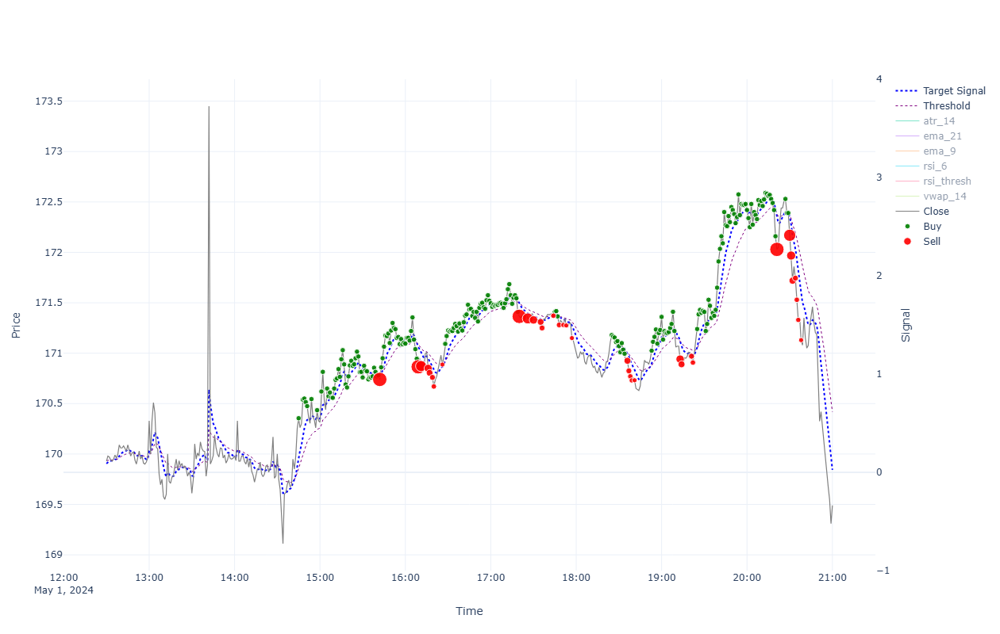


=== Performance for 2024-05-01 ===

INTRADAY:
  shares(588); [ask_buy=170.034, fee_buy=0.004, pos_amnt_buy=99982.344]; [bid_sell=169.456, fee_sell=0.018, pos_amnt_sell=99629.669]; PNL=-352.675
TRADES:
  Tr[1]: Time(14:45)Ask(170.389)Bid(170.321)Act(Buy)Shrs(2)Pos(2); CashTr(-340.786)=Cost(-340.778)-Fee(-0.008); P&L(99999.856)=CashTot(99659.214)+PosAmt(340.642)
  Tr[2]: Time(14:48)Ask(170.574)Bid(170.506)Act(Buy)Shrs(2)Pos(4); CashTr(-341.156)=Cost(-341.148)-Fee(-0.008); P&L(100000.081)=CashTot(99318.058)+PosAmt(682.024)
  Tr[3]: Time(14:49)Ask(170.584)Bid(170.516)Act(Buy)Shrs(2)Pos(6); CashTr(-341.176)=Cost(-341.168)-Fee(-0.008); P&L(99999.976)=CashTot(98976.882)+PosAmt(1023.095)
  Tr[4]: Time(14:50)Ask(170.549)Bid(170.481)Act(Buy)Shrs(2)Pos(8); CashTr(-341.106)=Cost(-341.098)-Fee(-0.008); P&L(99999.623)=CashTot(98635.775)+PosAmt(1363.847)
  Tr[5]: Time(14:51)Ask(170.509)Bid(170.441)Act(Buy)Shrs(2)Pos(10); CashTr(-341.026)=Cost(-341.018)-Fee(-0.008); P&L(99999.158)=CashTot(98294.749)+

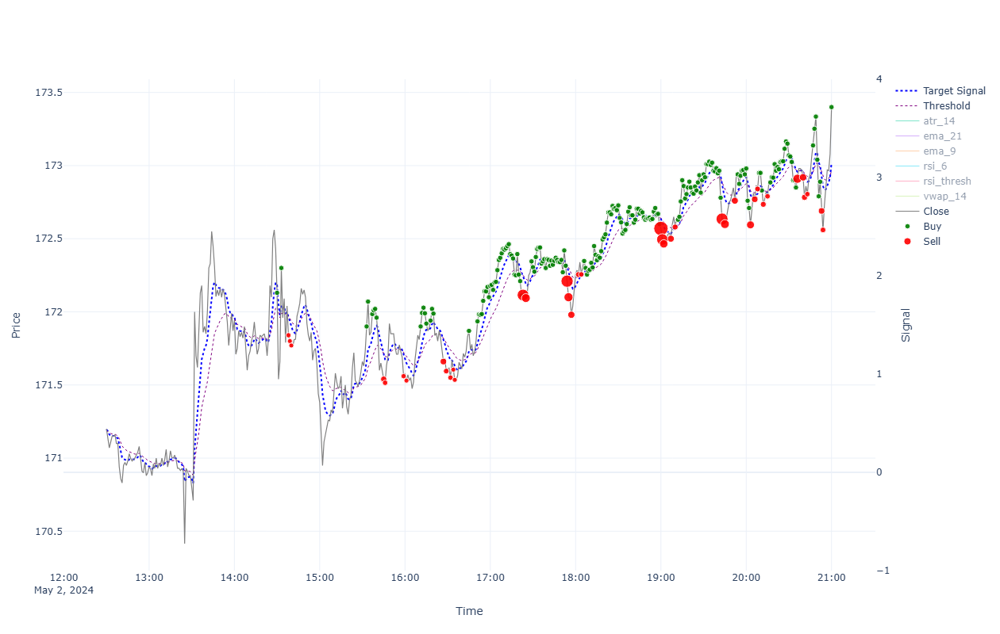


=== Performance for 2024-05-02 ===

INTRADAY:
  shares(578); [ask_buy=172.164, fee_buy=0.004, pos_amnt_buy=99513.35]; [bid_sell=173.365, fee_sell=0.018, pos_amnt_sell=100194.763]; PNL=681.413
TRADES:
  Tr[1]: Time(14:30)Ask(172.164)Bid(172.096)Act(Buy)Shrs(2)Pos(2); CashTr(-344.337)=Cost(-344.329)-Fee(-0.008); P&L(99914.354)=CashTot(99570.162)+PosAmt(344.191)
  Tr[2]: Time(14:33)Ask(172.334)Bid(172.266)Act(Buy)Shrs(2)Pos(4); CashTr(-344.677)=Cost(-344.669)-Fee(-0.008); P&L(99914.548)=CashTot(99225.485)+PosAmt(689.062)
  Tr[3]: Time(14:38)Ask(171.874)Bid(171.806)Act(Sell)Shrs(2)Pos(2); CashTr(343.575)=Cost(343.611)-Fee(-0.036); P&L(99912.672)=CashTot(99569.061)+PosAmt(343.611)
  Tr[4]: Time(14:39)Ask(171.834)Bid(171.766)Act(Sell)Shrs(1)Pos(1); CashTr(171.748)=Cost(171.766)-Fee(-0.018); P&L(99912.574)=CashTot(99740.809)+PosAmt(171.766)
  Tr[5]: Time(14:40)Ask(171.804)Bid(171.736)Act(Sell)Shrs(1)Pos(0); CashTr(171.718)=Cost(171.736)-Fee(-0.018); P&L(99912.526)=CashTot(99912.526)+PosAmt(0

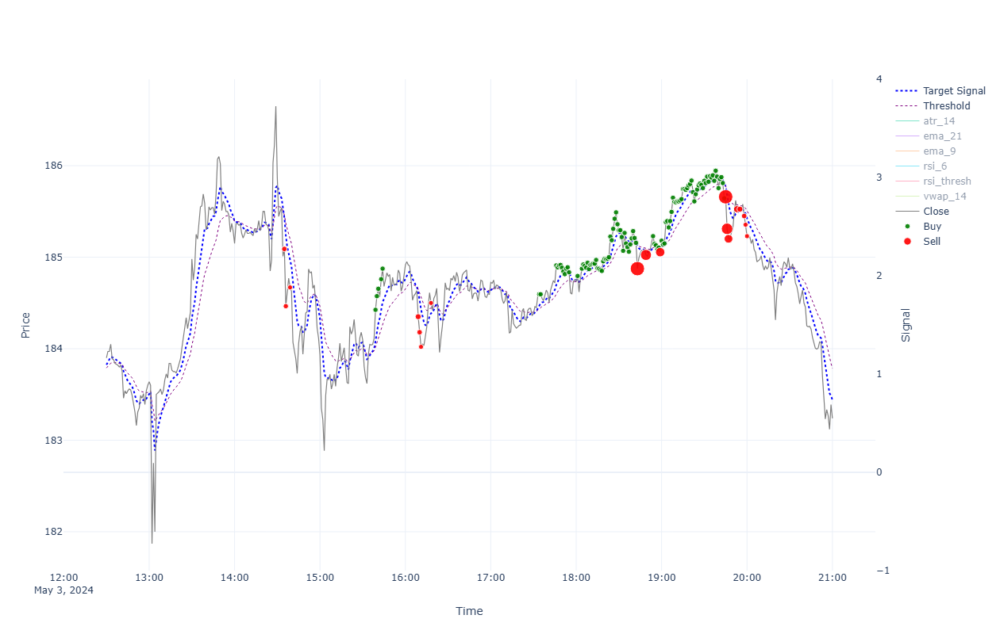


=== Performance for 2024-05-03 ===

INTRADAY:
  shares(538); [ask_buy=185.907, fee_buy=0.004, pos_amnt_buy=100020.212]; [bid_sell=183.203, fee_sell=0.018, pos_amnt_sell=98553.233]; PNL=-1466.979
TRADES:
  Tr[1]: Time(14:35)Ask(185.127)Bid(185.053)Act(Sell)Shrs(3)Pos(3); CashTr(555.104)=Cost(555.159)-Fee(-0.055); P&L(99890.628)=CashTot(99335.469)+PosAmt(555.159)
  Tr[2]: Time(14:36)Ask(184.502)Bid(184.428)Act(Sell)Shrs(2)Pos(1); CashTr(368.82)=Cost(368.856)-Fee(-0.036); P&L(99888.717)=CashTot(99704.289)+PosAmt(184.428)
  Tr[3]: Time(14:39)Ask(184.707)Bid(184.633)Act(Sell)Shrs(1)Pos(0); CashTr(184.615)=Cost(184.633)-Fee(-0.018); P&L(99888.903)=CashTot(99888.903)+PosAmt(0.0)
  Tr[4]: Time(15:39)Ask(184.462)Bid(184.388)Act(Buy)Shrs(2)Pos(2); CashTr(-368.932)=Cost(-368.924)-Fee(-0.008); P&L(99888.748)=CashTot(99519.972)+PosAmt(368.776)
  Tr[5]: Time(15:40)Ask(184.611)Bid(184.537)Act(Buy)Shrs(2)Pos(4); CashTr(-369.23)=Cost(-369.222)-Fee(-0.008); P&L(99888.891)=CashTot(99150.741)+PosAmt(738.

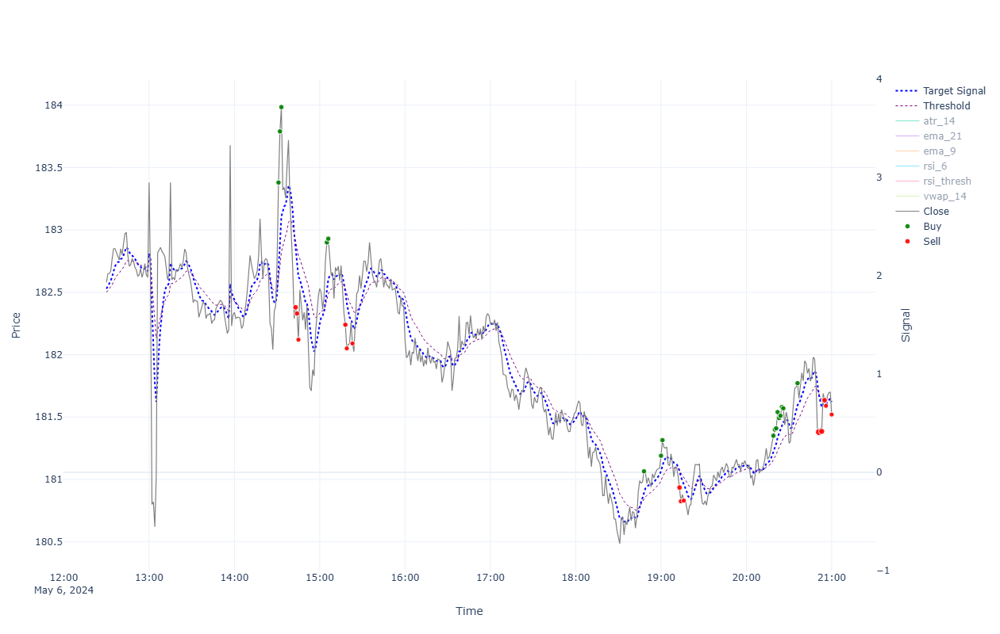


=== Performance for 2024-05-06 ===

INTRADAY:
  shares(539); [ask_buy=182.797, fee_buy=0.004, pos_amnt_buy=98529.498]; [bid_sell=181.484, fee_sell=0.018, pos_amnt_sell=97809.921]; PNL=-719.576
TRADES:
  Tr[1]: Time(14:31)Ask(183.417)Bid(183.343)Act(Buy)Shrs(2)Pos(2); CashTr(-366.841)=Cost(-366.833)-Fee(-0.008); P&L(99850.471)=CashTot(99483.784)+PosAmt(366.687)
  Tr[2]: Time(14:32)Ask(183.827)Bid(183.753)Act(Buy)Shrs(2)Pos(4); CashTr(-367.662)=Cost(-367.654)-Fee(-0.008); P&L(99851.136)=CashTot(99116.123)+PosAmt(735.013)
  Tr[3]: Time(14:33)Ask(184.022)Bid(183.948)Act(Buy)Shrs(2)Pos(6); CashTr(-368.052)=Cost(-368.044)-Fee(-0.008); P&L(99851.76)=CashTot(98748.071)+PosAmt(1103.689)
  Tr[4]: Time(14:43)Ask(182.416)Bid(182.344)Act(Sell)Shrs(3)Pos(3); CashTr(546.976)=Cost(547.031)-Fee(-0.055); P&L(99842.078)=CashTot(99295.047)+PosAmt(547.031)
  Tr[5]: Time(14:44)Ask(182.366)Bid(182.294)Act(Sell)Shrs(2)Pos(1); CashTr(364.551)=Cost(364.587)-Fee(-0.036); P&L(99841.891)=CashTot(99659.598)+PosAmt

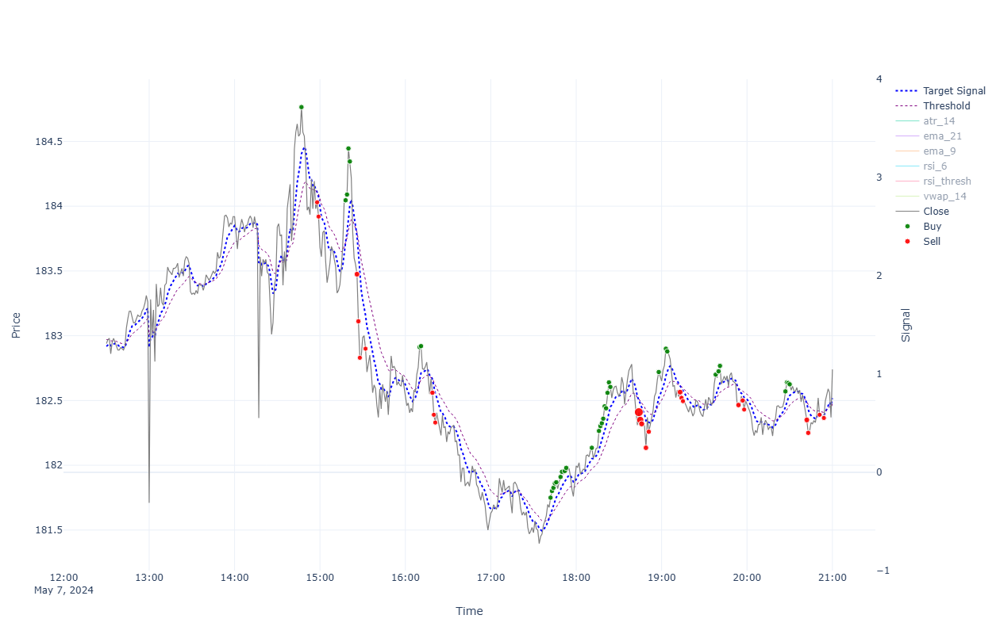


=== Performance for 2024-05-07 ===

INTRADAY:
  shares(531); [ask_buy=183.877, fee_buy=0.004, pos_amnt_buy=97640.688]; [bid_sell=182.703, fee_sell=0.018, pos_amnt_sell=97005.873]; PNL=-634.815
TRADES:
  Tr[1]: Time(14:47)Ask(184.802)Bid(184.728)Act(Buy)Shrs(2)Pos(2); CashTr(-369.612)=Cost(-369.604)-Fee(-0.008); P&L(99832.684)=CashTot(99463.228)+PosAmt(369.456)
  Tr[2]: Time(14:58)Ask(184.067)Bid(183.993)Act(Sell)Shrs(1)Pos(1); CashTr(183.975)=Cost(183.993)-Fee(-0.018); P&L(99831.196)=CashTot(99647.203)+PosAmt(183.993)
  Tr[3]: Time(14:59)Ask(183.957)Bid(183.883)Act(Sell)Shrs(1)Pos(0); CashTr(183.865)=Cost(183.883)-Fee(-0.018); P&L(99831.068)=CashTot(99831.068)+PosAmt(0.0)
  Tr[4]: Time(15:18)Ask(184.083)Bid(184.009)Act(Buy)Shrs(2)Pos(2); CashTr(-368.173)=Cost(-368.165)-Fee(-0.008); P&L(99830.913)=CashTot(99462.895)+PosAmt(368.018)
  Tr[5]: Time(15:19)Ask(184.127)Bid(184.053)Act(Buy)Shrs(2)Pos(4); CashTr(-368.261)=Cost(-368.253)-Fee(-0.008); P&L(99830.846)=CashTot(99094.634)+PosAmt(736

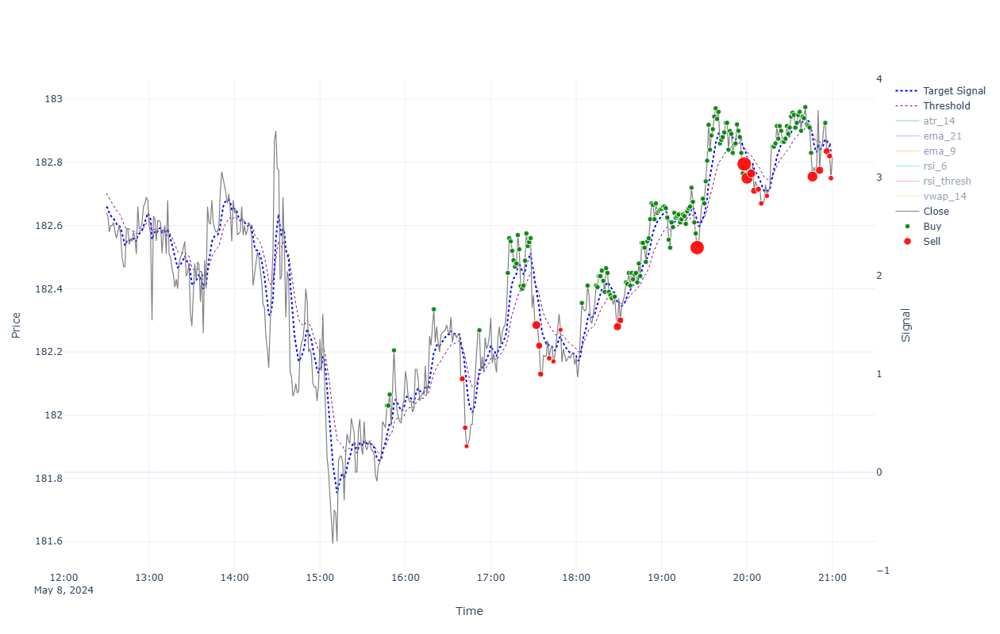


=== Performance for 2024-05-08 ===

INTRADAY:
  shares(530); [ask_buy=182.817, fee_buy=0.004, pos_amnt_buy=96894.895]; [bid_sell=182.783, fee_sell=0.018, pos_amnt_sell=96865.578]; PNL=-29.317
TRADES:
  Tr[1]: Time(15:47)Ask(182.066)Bid(181.994)Act(Buy)Shrs(2)Pos(2); CashTr(-364.141)=Cost(-364.133)-Fee(-0.008); P&L(99816.391)=CashTot(99452.404)+PosAmt(363.987)
  Tr[2]: Time(15:48)Ask(182.066)Bid(181.994)Act(Buy)Shrs(2)Pos(4); CashTr(-364.141)=Cost(-364.133)-Fee(-0.008); P&L(99816.238)=CashTot(99088.263)+PosAmt(727.974)
  Tr[3]: Time(15:49)Ask(182.101)Bid(182.029)Act(Buy)Shrs(2)Pos(6); CashTr(-364.211)=Cost(-364.203)-Fee(-0.008); P&L(99816.224)=CashTot(98724.053)+PosAmt(1092.172)
  Tr[4]: Time(15:52)Ask(182.241)Bid(182.169)Act(Buy)Shrs(2)Pos(8); CashTr(-364.491)=Cost(-364.483)-Fee(-0.008); P&L(99816.91)=CashTot(98359.562)+PosAmt(1457.348)
  Tr[5]: Time(16:20)Ask(182.371)Bid(182.299)Act(Buy)Shrs(2)Pos(10); CashTr(-364.751)=Cost(-364.743)-Fee(-0.008); P&L(99817.796)=CashTot(97994.811)+Pos

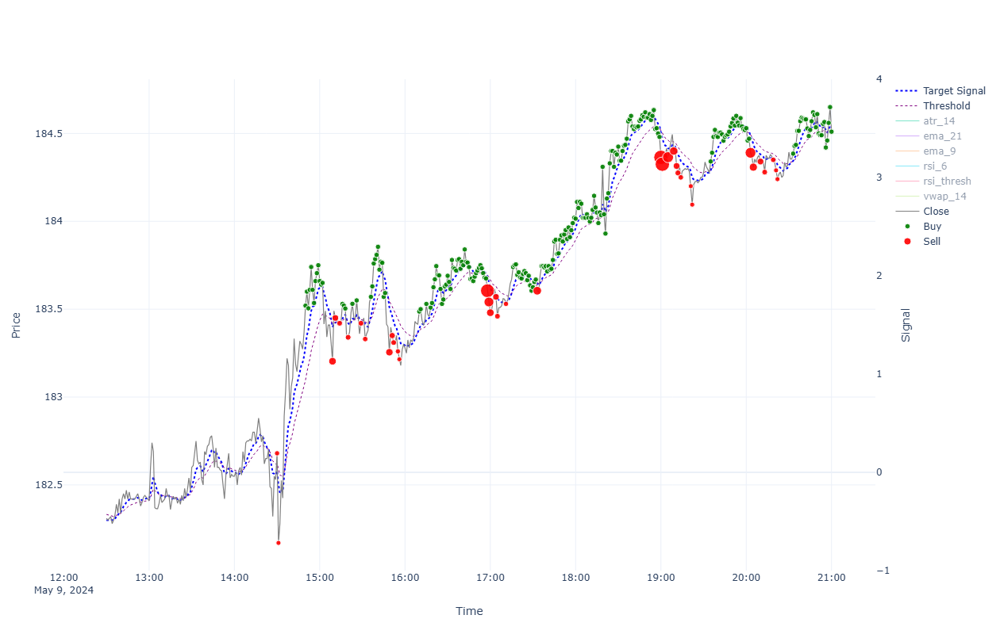


=== Performance for 2024-05-09 ===

INTRADAY:
  shares(530); [ask_buy=182.717, fee_buy=0.004, pos_amnt_buy=96841.884]; [bid_sell=184.473, fee_sell=0.018, pos_amnt_sell=97761.078]; PNL=919.194
TRADES:
  Tr[1]: Time(14:30)Ask(182.717)Bid(182.643)Act(Sell)Shrs(2)Pos(1); CashTr(365.251)=Cost(365.287)-Fee(-0.036); P&L(99773.071)=CashTot(99590.428)+PosAmt(182.643)
  Tr[2]: Time(14:31)Ask(182.206)Bid(182.134)Act(Sell)Shrs(1)Pos(0); CashTr(182.115)=Cost(182.134)-Fee(-0.018); P&L(99772.543)=CashTot(99772.543)+PosAmt(0.0)
  Tr[3]: Time(14:50)Ask(183.557)Bid(183.483)Act(Buy)Shrs(2)Pos(2); CashTr(-367.121)=Cost(-367.113)-Fee(-0.008); P&L(99772.388)=CashTot(99405.422)+PosAmt(366.967)
  Tr[4]: Time(14:51)Ask(183.637)Bid(183.563)Act(Buy)Shrs(2)Pos(4); CashTr(-367.281)=Cost(-367.273)-Fee(-0.008); P&L(99772.393)=CashTot(99038.14)+PosAmt(734.253)
  Tr[5]: Time(14:52)Ask(183.542)Bid(183.468)Act(Buy)Shrs(2)Pos(6); CashTr(-367.091)=Cost(-367.083)-Fee(-0.008); P&L(99771.858)=CashTot(98671.049)+PosAmt(1100.

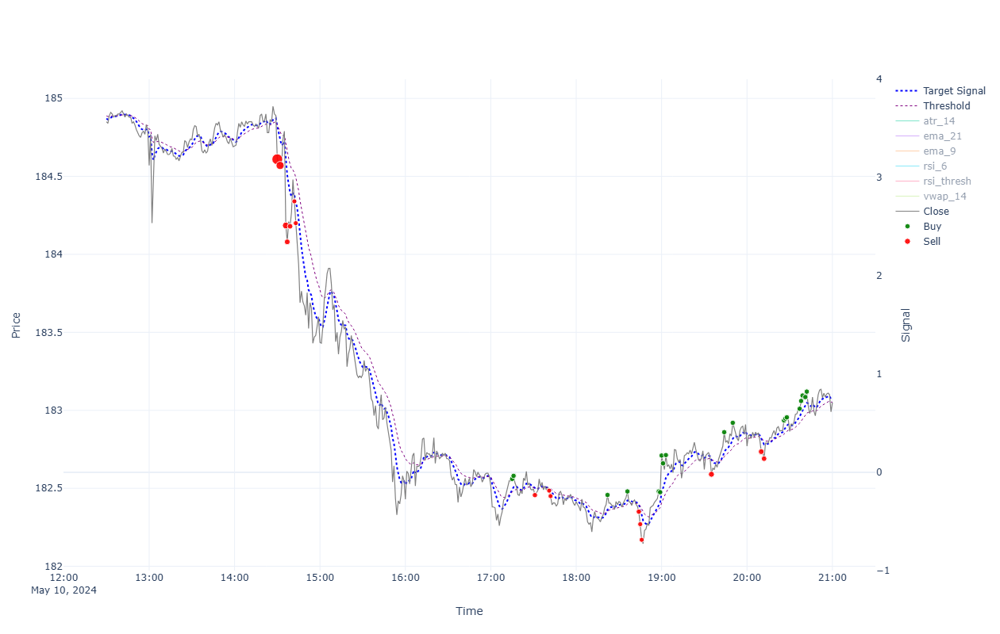


=== Performance for 2024-05-10 ===

INTRADAY:
  shares(529); [ask_buy=184.647, fee_buy=0.004, pos_amnt_buy=97680.338]; [bid_sell=183.013, fee_sell=0.018, pos_amnt_sell=96804.456]; PNL=-875.882
TRADES:
  Tr[1]: Time(14:30)Ask(184.647)Bid(184.573)Act(Sell)Shrs(25)Pos(31); CashTr(4613.871)=Cost(4614.327)-Fee(-0.456); P&L(99734.071)=CashTot(94012.306)+PosAmt(5721.765)
  Tr[2]: Time(14:32)Ask(184.607)Bid(184.533)Act(Sell)Shrs(14)Pos(17); CashTr(2583.208)=Cost(2583.463)-Fee(-0.255); P&L(99732.576)=CashTot(96595.514)+PosAmt(3137.062)
  Tr[3]: Time(14:36)Ask(184.222)Bid(184.148)Act(Sell)Shrs(8)Pos(9); CashTr(1473.039)=Cost(1473.185)-Fee(-0.146); P&L(99725.887)=CashTot(98068.553)+PosAmt(1657.333)
  Tr[4]: Time(14:37)Ask(184.117)Bid(184.043)Act(Sell)Shrs(4)Pos(5); CashTr(736.1)=Cost(736.173)-Fee(-0.073); P&L(99724.869)=CashTot(98804.653)+PosAmt(920.216)
  Tr[5]: Time(14:39)Ask(184.217)Bid(184.143)Act(Sell)Shrs(3)Pos(2); CashTr(552.375)=Cost(552.429)-Fee(-0.055); P&L(99725.314)=CashTot(99357.028

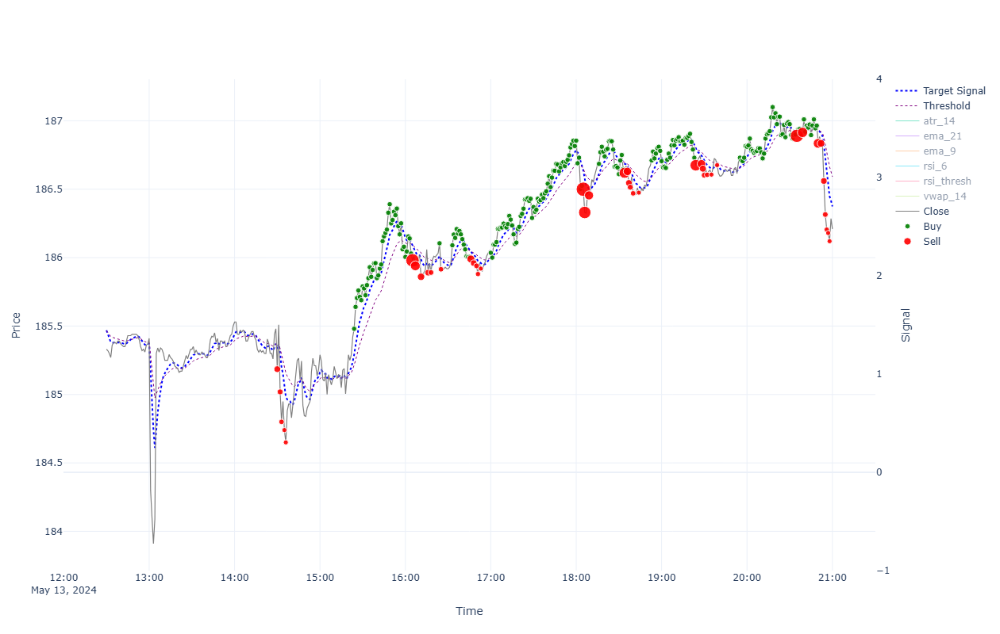


=== Performance for 2024-05-13 ===

INTRADAY:
  shares(522); [ask_buy=185.222, fee_buy=0.004, pos_amnt_buy=96687.991]; [bid_sell=186.173, fee_sell=0.018, pos_amnt_sell=97172.642]; PNL=484.65
TRADES:
  Tr[1]: Time(14:30)Ask(185.222)Bid(185.148)Act(Sell)Shrs(8)Pos(10); CashTr(1481.038)=Cost(1481.184)-Fee(-0.146); P&L(99760.082)=CashTot(97908.602)+PosAmt(1851.48)
  Tr[2]: Time(14:32)Ask(185.056)Bid(184.982)Act(Sell)Shrs(5)Pos(5); CashTr(924.819)=Cost(924.91)-Fee(-0.091); P&L(99758.332)=CashTot(98833.421)+PosAmt(924.91)
  Tr[3]: Time(14:33)Ask(184.837)Bid(184.763)Act(Sell)Shrs(3)Pos(2); CashTr(554.234)=Cost(554.289)-Fee(-0.055); P&L(99757.182)=CashTot(99387.656)+PosAmt(369.526)
  Tr[4]: Time(14:35)Ask(184.777)Bid(184.703)Act(Sell)Shrs(1)Pos(1); CashTr(184.685)=Cost(184.703)-Fee(-0.018); P&L(99757.044)=CashTot(99572.34)+PosAmt(184.703)
  Tr[5]: Time(14:36)Ask(184.687)Bid(184.613)Act(Sell)Shrs(1)Pos(0); CashTr(184.595)=Cost(184.613)-Fee(-0.018); P&L(99756.935)=CashTot(99756.935)+PosAmt(0.0)

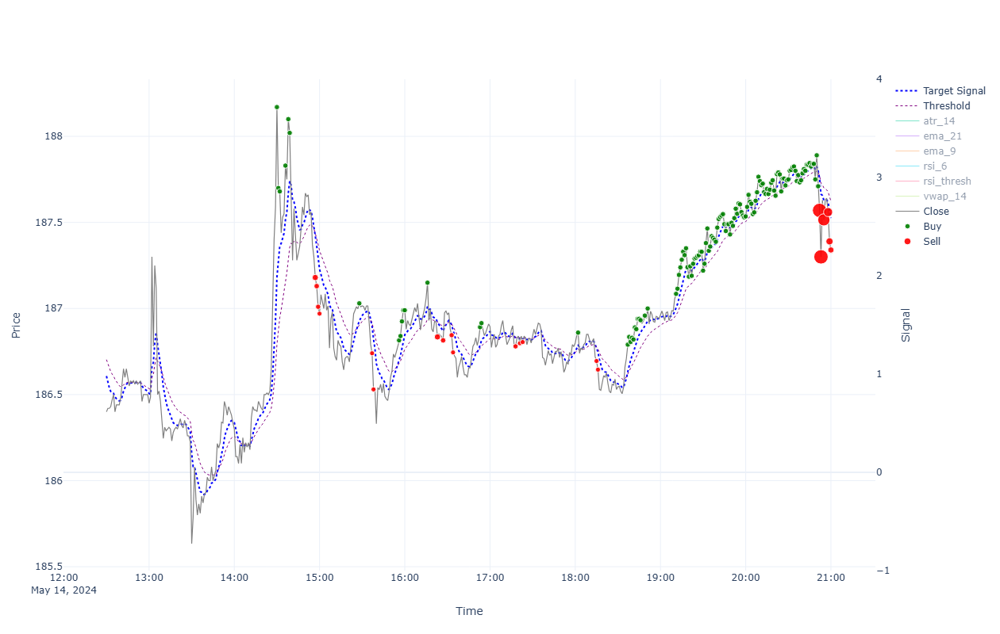


=== Performance for 2024-05-14 ===

INTRADAY:
  shares(516); [ask_buy=188.208, fee_buy=0.004, pos_amnt_buy=97117.203]; [bid_sell=187.303, fee_sell=0.018, pos_amnt_sell=96638.665]; PNL=-478.539
TRADES:
  Tr[1]: Time(14:30)Ask(188.208)Bid(188.132)Act(Buy)Shrs(2)Pos(2); CashTr(-376.423)=Cost(-376.415)-Fee(-0.008); P&L(99686.513)=CashTot(99310.249)+PosAmt(376.265)
  Tr[2]: Time(14:31)Ask(187.738)Bid(187.662)Act(Buy)Shrs(2)Pos(4); CashTr(-375.483)=Cost(-375.475)-Fee(-0.008); P&L(99685.415)=CashTot(98934.766)+PosAmt(750.65)
  Tr[3]: Time(14:32)Ask(187.718)Bid(187.642)Act(Buy)Shrs(2)Pos(6); CashTr(-375.443)=Cost(-375.435)-Fee(-0.008); P&L(99685.177)=CashTot(98559.323)+PosAmt(1125.855)
  Tr[4]: Time(14:36)Ask(187.868)Bid(187.792)Act(Buy)Shrs(2)Pos(8); CashTr(-375.743)=Cost(-375.735)-Fee(-0.008); P&L(99685.919)=CashTot(98183.579)+PosAmt(1502.339)
  Tr[5]: Time(14:38)Ask(188.138)Bid(188.062)Act(Buy)Shrs(2)Pos(10); CashTr(-376.283)=Cost(-376.275)-Fee(-0.008); P&L(99687.92)=CashTot(97807.296)+Pos

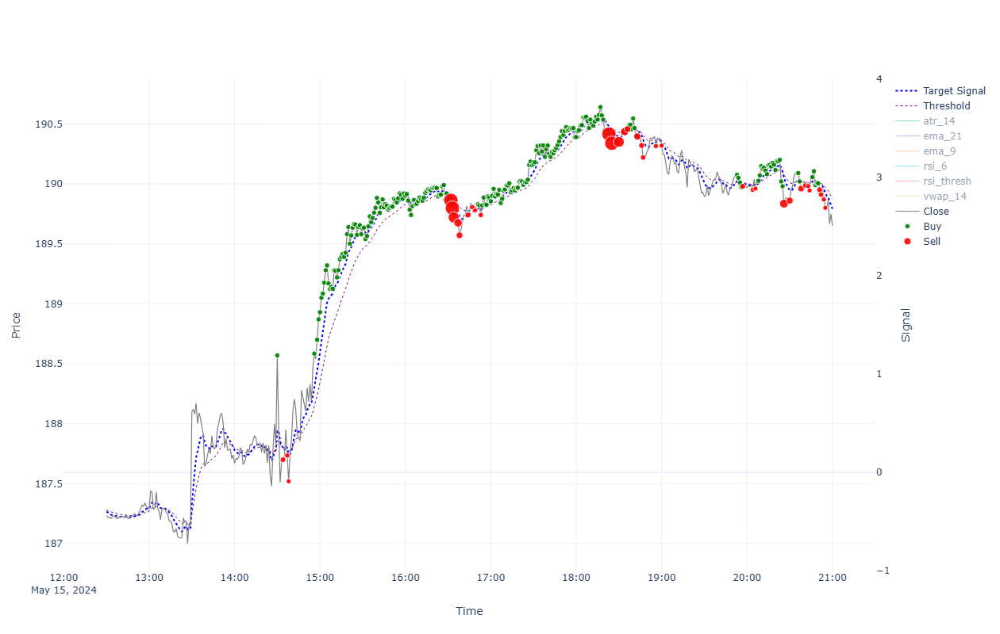


=== Performance for 2024-05-15 ===

INTRADAY:
  shares(512); [ask_buy=188.608, fee_buy=0.004, pos_amnt_buy=96569.198]; [bid_sell=189.612, fee_sell=0.018, pos_amnt_sell=97071.984]; PNL=502.787
TRADES:
  Tr[1]: Time(14:30)Ask(188.608)Bid(188.532)Act(Buy)Shrs(2)Pos(8); CashTr(-377.223)=Cost(-377.215)-Fee(-0.008); P&L(99652.044)=CashTot(98143.785)+PosAmt(1508.258)
  Tr[2]: Time(14:34)Ask(187.738)Bid(187.662)Act(Sell)Shrs(4)Pos(4); CashTr(750.577)=Cost(750.65)-Fee(-0.073); P&L(99645.012)=CashTot(98894.362)+PosAmt(750.65)
  Tr[3]: Time(14:37)Ask(187.773)Bid(187.697)Act(Sell)Shrs(2)Pos(2); CashTr(375.358)=Cost(375.395)-Fee(-0.037); P&L(99645.115)=CashTot(99269.72)+PosAmt(375.395)
  Tr[4]: Time(14:38)Ask(187.558)Bid(187.482)Act(Sell)Shrs(1)Pos(1); CashTr(187.464)=Cost(187.482)-Fee(-0.018); P&L(99644.667)=CashTot(99457.185)+PosAmt(187.482)
  Tr[5]: Time(14:56)Ask(188.623)Bid(188.547)Act(Buy)Shrs(2)Pos(3); CashTr(-377.253)=Cost(-377.245)-Fee(-0.008); P&L(99645.573)=CashTot(99079.931)+PosAmt(565

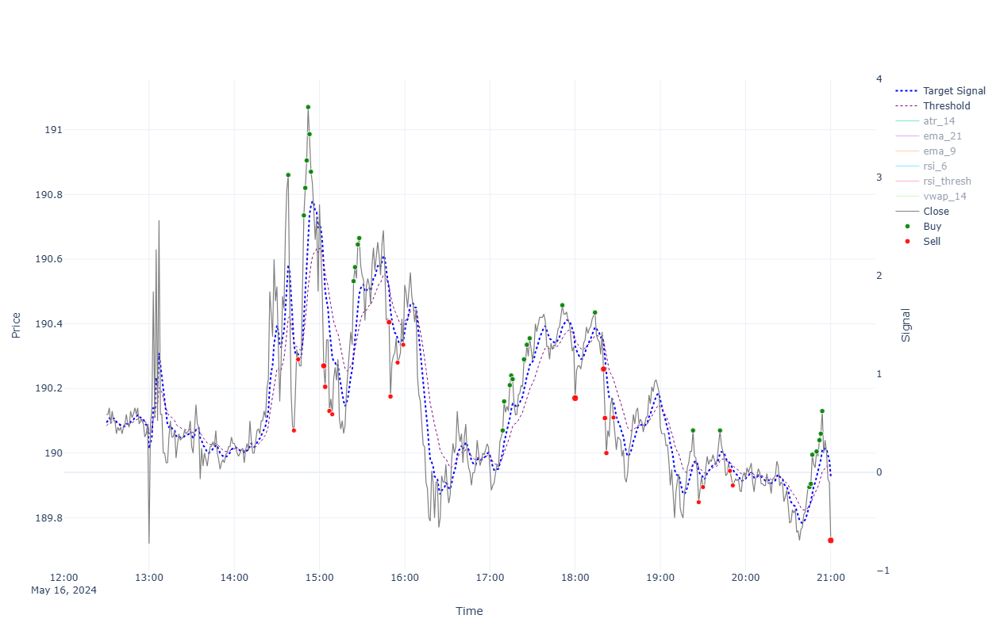


=== Performance for 2024-05-16 ===

INTRADAY:
  shares(509); [ask_buy=190.553, fee_buy=0.004, pos_amnt_buy=96993.565]; [bid_sell=189.692, fee_sell=0.018, pos_amnt_sell=96543.914]; PNL=-449.652
TRADES:
  Tr[1]: Time(14:38)Ask(190.898)Bid(190.822)Act(Buy)Shrs(2)Pos(2); CashTr(-381.804)=Cost(-381.796)-Fee(-0.008); P&L(99646.013)=CashTot(99264.37)+PosAmt(381.643)
  Tr[2]: Time(14:42)Ask(190.108)Bid(190.032)Act(Sell)Shrs(1)Pos(1); CashTr(190.014)=Cost(190.032)-Fee(-0.018); P&L(99644.415)=CashTot(99454.383)+PosAmt(190.032)
  Tr[3]: Time(14:45)Ask(190.328)Bid(190.252)Act(Sell)Shrs(1)Pos(0); CashTr(190.234)=Cost(190.252)-Fee(-0.018); P&L(99644.617)=CashTot(99644.617)+PosAmt(0.0)
  Tr[4]: Time(14:49)Ask(190.773)Bid(190.697)Act(Buy)Shrs(2)Pos(2); CashTr(-381.554)=Cost(-381.546)-Fee(-0.008); P&L(99644.456)=CashTot(99263.063)+PosAmt(381.394)
  Tr[5]: Time(14:50)Ask(190.858)Bid(190.782)Act(Buy)Shrs(2)Pos(4); CashTr(-381.724)=Cost(-381.716)-Fee(-0.008); P&L(99644.466)=CashTot(98881.338)+PosAmt(763.

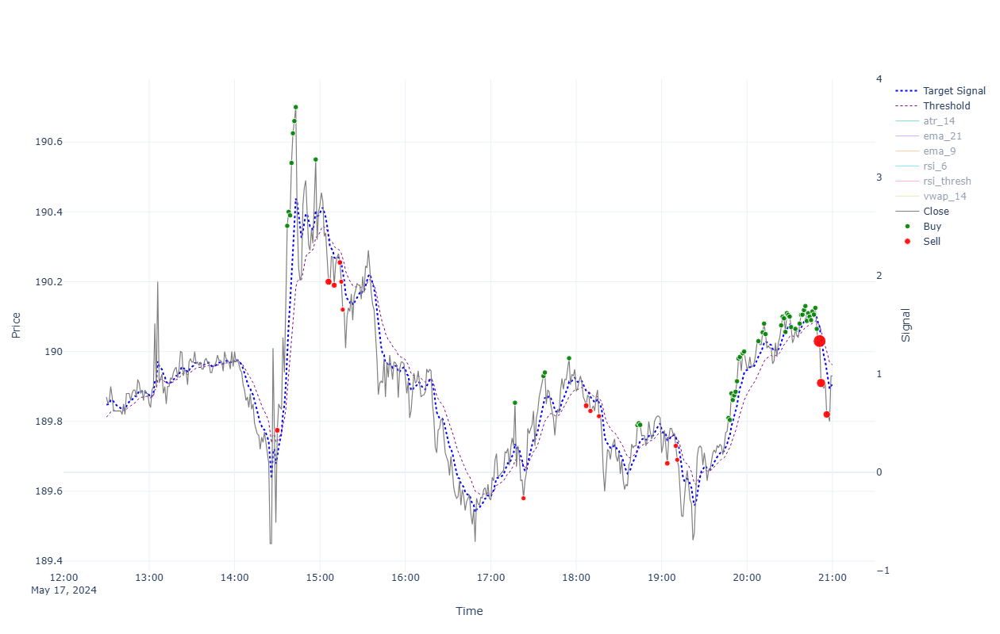


=== Performance for 2024-05-17 ===

INTRADAY:
  shares(508); [ask_buy=189.813, fee_buy=0.004, pos_amnt_buy=96426.81]; [bid_sell=189.892, fee_sell=0.018, pos_amnt_sell=96455.817]; PNL=29.008
TRADES:
  Tr[1]: Time(14:30)Ask(189.813)Bid(189.737)Act(Sell)Shrs(4)Pos(3); CashTr(758.873)=Cost(758.947)-Fee(-0.073); P&L(99622.129)=CashTot(99052.919)+PosAmt(569.21)
  Tr[2]: Time(14:37)Ask(190.398)Bid(190.322)Act(Buy)Shrs(2)Pos(5); CashTr(-380.804)=Cost(-380.796)-Fee(-0.008); P&L(99623.724)=CashTot(98672.115)+PosAmt(951.61)
  Tr[3]: Time(14:38)Ask(190.438)Bid(190.362)Act(Buy)Shrs(2)Pos(7); CashTr(-380.884)=Cost(-380.876)-Fee(-0.008); P&L(99623.764)=CashTot(98291.231)+PosAmt(1332.533)
  Tr[4]: Time(14:39)Ask(190.428)Bid(190.352)Act(Buy)Shrs(2)Pos(9); CashTr(-380.864)=Cost(-380.856)-Fee(-0.008); P&L(99623.534)=CashTot(97910.366)+PosAmt(1713.167)
  Tr[5]: Time(14:40)Ask(190.578)Bid(190.502)Act(Buy)Shrs(2)Pos(11); CashTr(-381.164)=Cost(-381.156)-Fee(-0.008); P&L(99624.723)=CashTot(97529.202)+PosAmt(

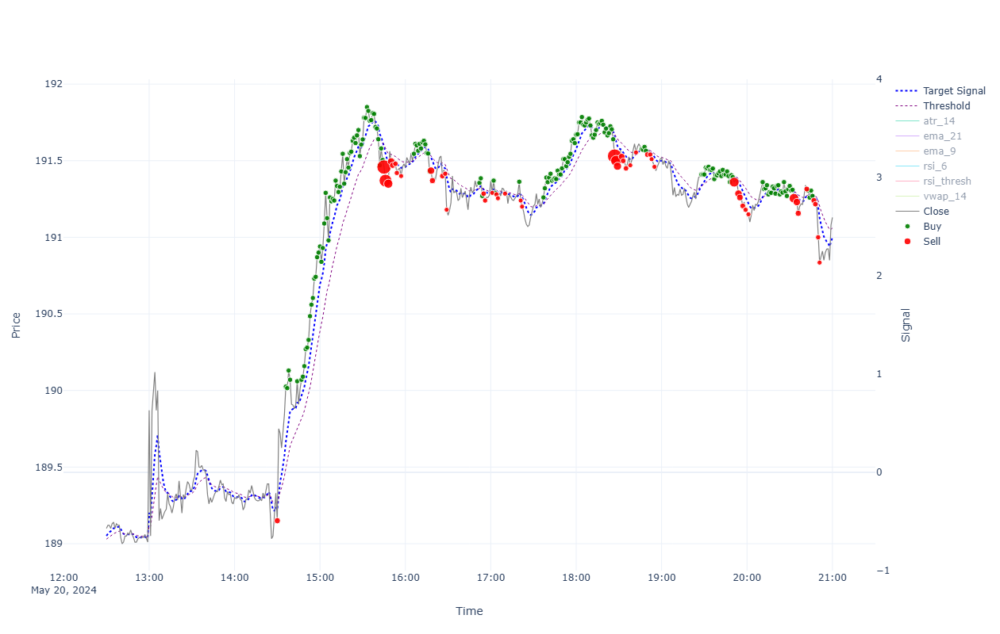


=== Performance for 2024-05-20 ===

INTRADAY:
  shares(509); [ask_buy=189.188, fee_buy=0.004, pos_amnt_buy=96298.641]; [bid_sell=191.092, fee_sell=0.018, pos_amnt_sell=97256.355]; PNL=957.714
TRADES:
  Tr[1]: Time(14:30)Ask(189.188)Bid(189.112)Act(Sell)Shrs(6)Pos(6); CashTr(1134.563)=Cost(1134.673)-Fee(-0.11); P&L(99591.036)=CashTot(98456.363)+PosAmt(1134.673)
  Tr[2]: Time(14:36)Ask(190.063)Bid(189.987)Act(Buy)Shrs(2)Pos(8); CashTr(-380.134)=Cost(-380.126)-Fee(-0.008); P&L(99596.125)=CashTot(98076.229)+PosAmt(1519.896)
  Tr[3]: Time(14:37)Ask(190.053)Bid(189.977)Act(Buy)Shrs(2)Pos(10); CashTr(-380.114)=Cost(-380.106)-Fee(-0.008); P&L(99595.885)=CashTot(97696.115)+PosAmt(1899.77)
  Tr[4]: Time(14:38)Ask(190.168)Bid(190.092)Act(Buy)Shrs(2)Pos(12); CashTr(-380.344)=Cost(-380.336)-Fee(-0.008); P&L(99596.874)=CashTot(97315.771)+PosAmt(2281.104)
  Tr[5]: Time(14:39)Ask(190.108)Bid(190.032)Act(Buy)Shrs(2)Pos(14); CashTr(-380.224)=Cost(-380.216)-Fee(-0.008); P&L(99595.994)=CashTot(96935.547)

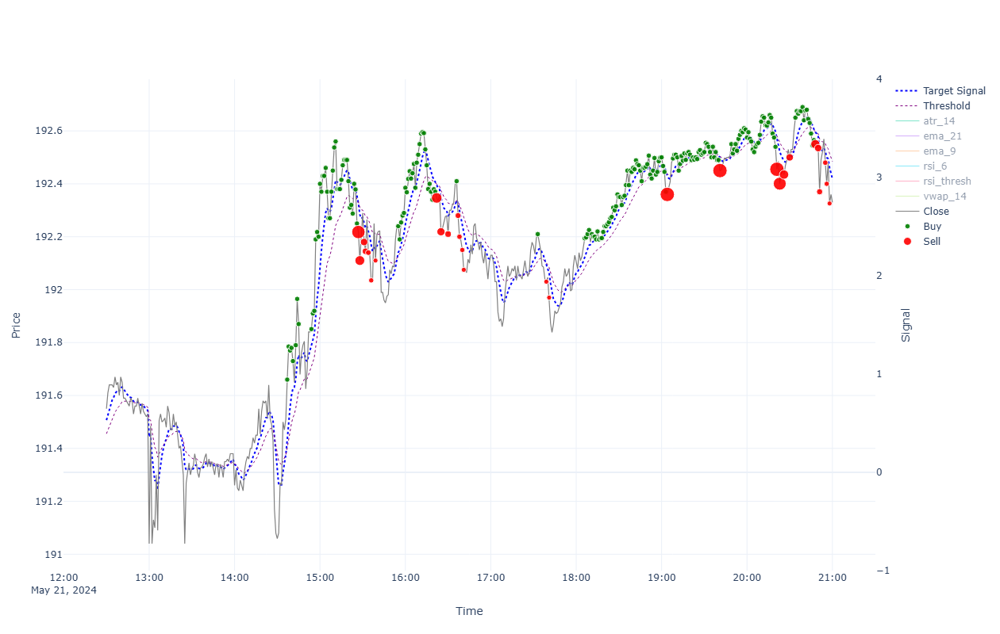


=== Performance for 2024-05-21 ===

INTRADAY:
  shares(508); [ask_buy=191.098, fee_buy=0.004, pos_amnt_buy=97079.568]; [bid_sell=192.292, fee_sell=0.018, pos_amnt_sell=97674.746]; PNL=595.178
TRADES:
  Tr[1]: Time(14:37)Ask(191.698)Bid(191.622)Act(Buy)Shrs(2)Pos(2); CashTr(-383.405)=Cost(-383.397)-Fee(-0.008); P&L(99578.292)=CashTot(99195.048)+PosAmt(383.243)
  Tr[2]: Time(14:38)Ask(191.823)Bid(191.747)Act(Buy)Shrs(2)Pos(4); CashTr(-383.655)=Cost(-383.647)-Fee(-0.008); P&L(99578.38)=CashTot(98811.393)+PosAmt(766.987)
  Tr[3]: Time(14:39)Ask(191.808)Bid(191.732)Act(Buy)Shrs(2)Pos(6); CashTr(-383.625)=Cost(-383.617)-Fee(-0.008); P&L(99578.159)=CashTot(98427.769)+PosAmt(1150.39)
  Tr[4]: Time(14:40)Ask(191.818)Bid(191.742)Act(Buy)Shrs(2)Pos(8); CashTr(-383.645)=Cost(-383.637)-Fee(-0.008); P&L(99578.057)=CashTot(98044.124)+PosAmt(1533.933)
  Tr[5]: Time(14:41)Ask(191.768)Bid(191.692)Act(Buy)Shrs(2)Pos(10); CashTr(-383.545)=Cost(-383.537)-Fee(-0.008); P&L(99577.496)=CashTot(97660.579)+PosA

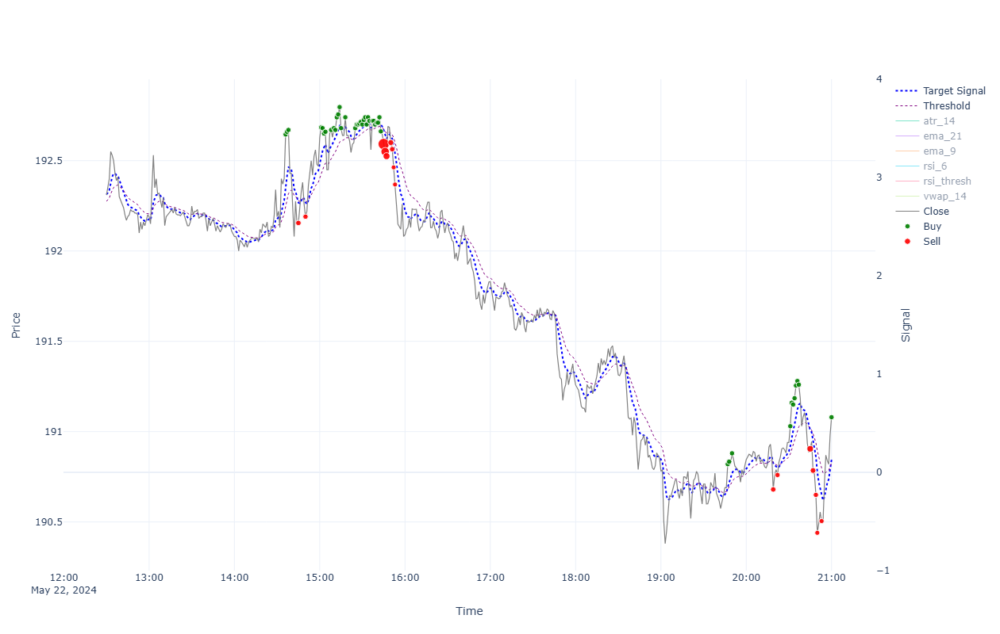


=== Performance for 2024-05-22 ===

INTRADAY:
  shares(508); [ask_buy=192.228, fee_buy=0.004, pos_amnt_buy=97654.079]; [bid_sell=191.042, fee_sell=0.018, pos_amnt_sell=97039.887]; PNL=-614.191
TRADES:
  Tr[1]: Time(14:36)Ask(192.684)Bid(192.606)Act(Buy)Shrs(2)Pos(2); CashTr(-385.375)=Cost(-385.367)-Fee(-0.008); P&L(99513.53)=CashTot(99128.317)+PosAmt(385.213)
  Tr[2]: Time(14:37)Ask(192.699)Bid(192.621)Act(Buy)Shrs(2)Pos(4); CashTr(-385.405)=Cost(-385.397)-Fee(-0.008); P&L(99513.398)=CashTot(98742.912)+PosAmt(770.486)
  Tr[3]: Time(14:38)Ask(192.709)Bid(192.631)Act(Buy)Shrs(2)Pos(6); CashTr(-385.425)=Cost(-385.417)-Fee(-0.008); P&L(99513.276)=CashTot(98357.487)+PosAmt(1155.789)
  Tr[4]: Time(14:45)Ask(192.193)Bid(192.117)Act(Sell)Shrs(3)Pos(3); CashTr(576.294)=Cost(576.35)-Fee(-0.055); P&L(99510.131)=CashTot(98933.782)+PosAmt(576.35)
  Tr[5]: Time(14:50)Ask(192.228)Bid(192.152)Act(Sell)Shrs(2)Pos(1); CashTr(384.266)=Cost(384.303)-Fee(-0.037); P&L(99510.2)=CashTot(99318.048)+PosAmt(192

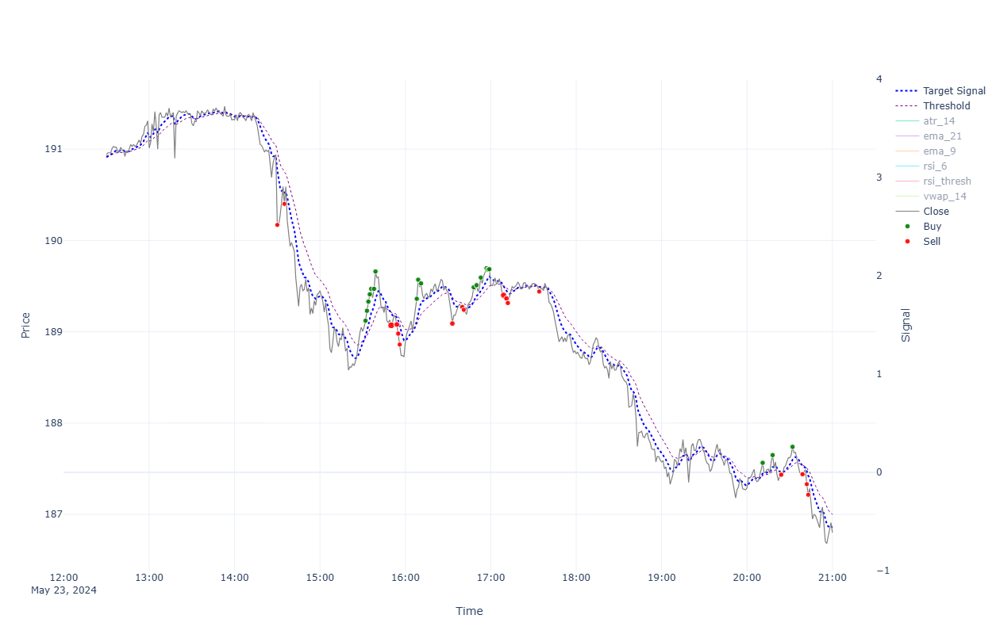


=== Performance for 2024-05-23 ===

INTRADAY:
  shares(510); [ask_buy=190.208, fee_buy=0.004, pos_amnt_buy=97008.137]; [bid_sell=186.763, fee_sell=0.018, pos_amnt_sell=95239.621]; PNL=-1768.517
TRADES:
  Tr[1]: Time(14:30)Ask(190.208)Bid(190.132)Act(Sell)Shrs(1)Pos(1); CashTr(190.114)=Cost(190.132)-Fee(-0.018); P&L(99485.722)=CashTot(99295.59)+PosAmt(190.132)
  Tr[2]: Time(14:35)Ask(190.438)Bid(190.362)Act(Sell)Shrs(1)Pos(0); CashTr(190.344)=Cost(190.362)-Fee(-0.018); P&L(99485.934)=CashTot(99485.934)+PosAmt(0.0)
  Tr[3]: Time(15:32)Ask(189.159)Bid(189.083)Act(Buy)Shrs(2)Pos(2); CashTr(-378.326)=Cost(-378.318)-Fee(-0.008); P&L(99485.774)=CashTot(99107.608)+PosAmt(378.167)
  Tr[4]: Time(15:33)Ask(189.268)Bid(189.192)Act(Buy)Shrs(2)Pos(4); CashTr(-378.544)=Cost(-378.536)-Fee(-0.008); P&L(99485.833)=CashTot(98729.064)+PosAmt(756.769)
  Tr[5]: Time(15:34)Ask(189.368)Bid(189.292)Act(Buy)Shrs(2)Pos(6); CashTr(-378.744)=Cost(-378.736)-Fee(-0.008); P&L(99486.073)=CashTot(98350.32)+PosAmt(1135

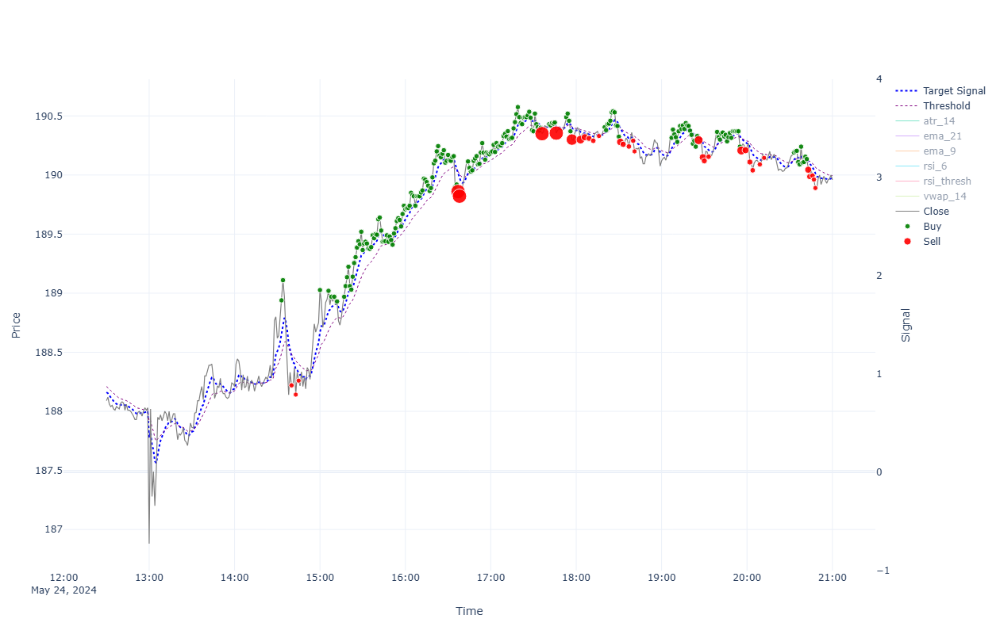


=== Performance for 2024-05-24 ===

INTRADAY:
  shares(504); [ask_buy=188.658, fee_buy=0.004, pos_amnt_buy=95085.509]; [bid_sell=189.922, fee_sell=0.018, pos_amnt_sell=95711.439]; PNL=625.931
TRADES:
  Tr[1]: Time(14:33)Ask(188.977)Bid(188.902)Act(Buy)Shrs(2)Pos(2); CashTr(-377.962)=Cost(-377.954)-Fee(-0.008); P&L(99471.076)=CashTot(99093.273)+PosAmt(377.803)
  Tr[2]: Time(14:34)Ask(189.148)Bid(189.072)Act(Buy)Shrs(2)Pos(4); CashTr(-378.304)=Cost(-378.296)-Fee(-0.008); P&L(99471.258)=CashTot(98714.969)+PosAmt(756.289)
  Tr[3]: Time(14:40)Ask(188.258)Bid(188.182)Act(Sell)Shrs(2)Pos(2); CashTr(376.328)=Cost(376.365)-Fee(-0.037); P&L(99467.662)=CashTot(99091.297)+PosAmt(376.365)
  Tr[4]: Time(14:43)Ask(188.179)Bid(188.104)Act(Sell)Shrs(1)Pos(1); CashTr(188.085)=Cost(188.104)-Fee(-0.018); P&L(99467.487)=CashTot(99279.383)+PosAmt(188.104)
  Tr[5]: Time(14:45)Ask(188.297)Bid(188.222)Act(Sell)Shrs(1)Pos(0); CashTr(188.204)=Cost(188.222)-Fee(-0.018); P&L(99467.587)=CashTot(99467.587)+PosAmt(0

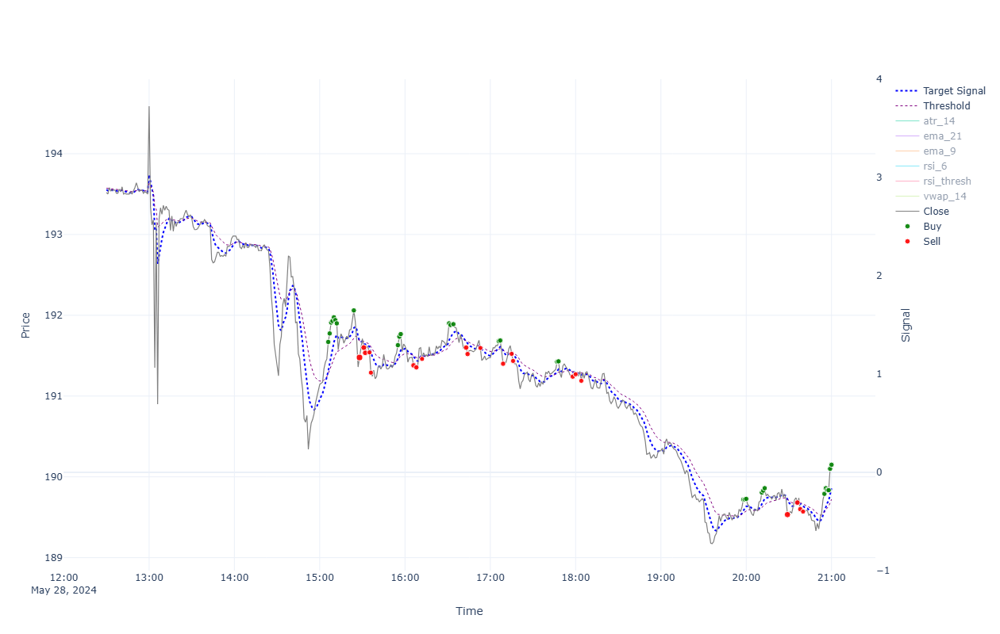


=== Performance for 2024-05-28 ===

INTRADAY:
  shares(499); [ask_buy=191.443, fee_buy=0.004, pos_amnt_buy=95532.193]; [bid_sell=190.112, fee_sell=0.018, pos_amnt_sell=94856.71]; PNL=-675.483
TRADES:
  Tr[1]: Time(15:06)Ask(191.708)Bid(191.632)Act(Buy)Shrs(2)Pos(2); CashTr(-383.425)=Cost(-383.417)-Fee(-0.008); P&L(99473.018)=CashTot(99089.755)+PosAmt(383.263)
  Tr[2]: Time(15:07)Ask(191.813)Bid(191.737)Act(Buy)Shrs(2)Pos(4); CashTr(-383.635)=Cost(-383.627)-Fee(-0.008); P&L(99473.067)=CashTot(98706.12)+PosAmt(766.947)
  Tr[3]: Time(15:08)Ask(191.948)Bid(191.872)Act(Buy)Shrs(2)Pos(6); CashTr(-383.905)=Cost(-383.897)-Fee(-0.008); P&L(99473.445)=CashTot(98322.215)+PosAmt(1151.23)
  Tr[4]: Time(15:09)Ask(191.968)Bid(191.892)Act(Buy)Shrs(2)Pos(8); CashTr(-383.945)=Cost(-383.937)-Fee(-0.008); P&L(99473.403)=CashTot(97938.271)+PosAmt(1535.133)
  Tr[5]: Time(15:10)Ask(192.013)Bid(191.937)Act(Buy)Shrs(2)Pos(10); CashTr(-384.035)=Cost(-384.027)-Fee(-0.008); P&L(99473.602)=CashTot(97554.236)+PosA

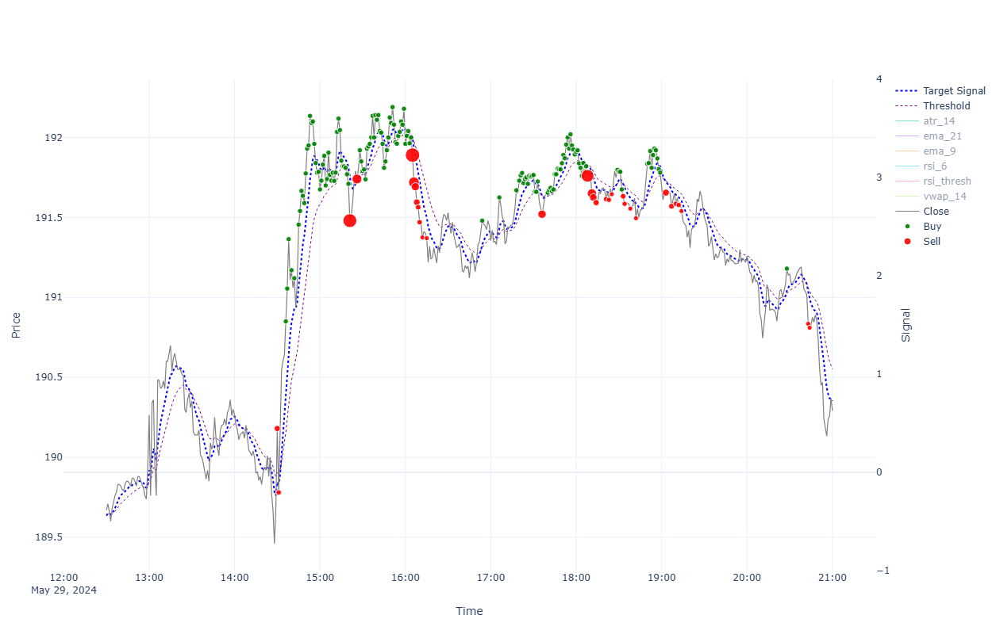


=== Performance for 2024-05-29 ===

INTRADAY:
  shares(498); [ask_buy=190.218, fee_buy=0.004, pos_amnt_buy=94730.574]; [bid_sell=190.252, fee_sell=0.018, pos_amnt_sell=94736.321]; PNL=5.747
TRADES:
  Tr[1]: Time(14:30)Ask(190.218)Bid(190.142)Act(Sell)Shrs(6)Pos(6); CashTr(1140.742)=Cost(1140.852)-Fee(-0.11); P&L(99456.327)=CashTot(98315.475)+PosAmt(1140.852)
  Tr[2]: Time(14:31)Ask(189.818)Bid(189.742)Act(Sell)Shrs(3)Pos(3); CashTr(569.171)=Cost(569.226)-Fee(-0.055); P&L(99453.873)=CashTot(98884.646)+PosAmt(569.226)
  Tr[3]: Time(14:36)Ask(190.888)Bid(190.812)Act(Buy)Shrs(2)Pos(5); CashTr(-381.784)=Cost(-381.776)-Fee(-0.008); P&L(99456.921)=CashTot(98502.862)+PosAmt(954.059)
  Tr[4]: Time(14:37)Ask(191.093)Bid(191.017)Act(Buy)Shrs(2)Pos(7); CashTr(-382.194)=Cost(-382.186)-Fee(-0.008); P&L(99457.785)=CashTot(98120.668)+PosAmt(1337.118)
  Tr[5]: Time(14:38)Ask(191.402)Bid(191.326)Act(Buy)Shrs(2)Pos(9); CashTr(-382.813)=Cost(-382.805)-Fee(-0.008); P&L(99459.788)=CashTot(97737.855)+PosAmt

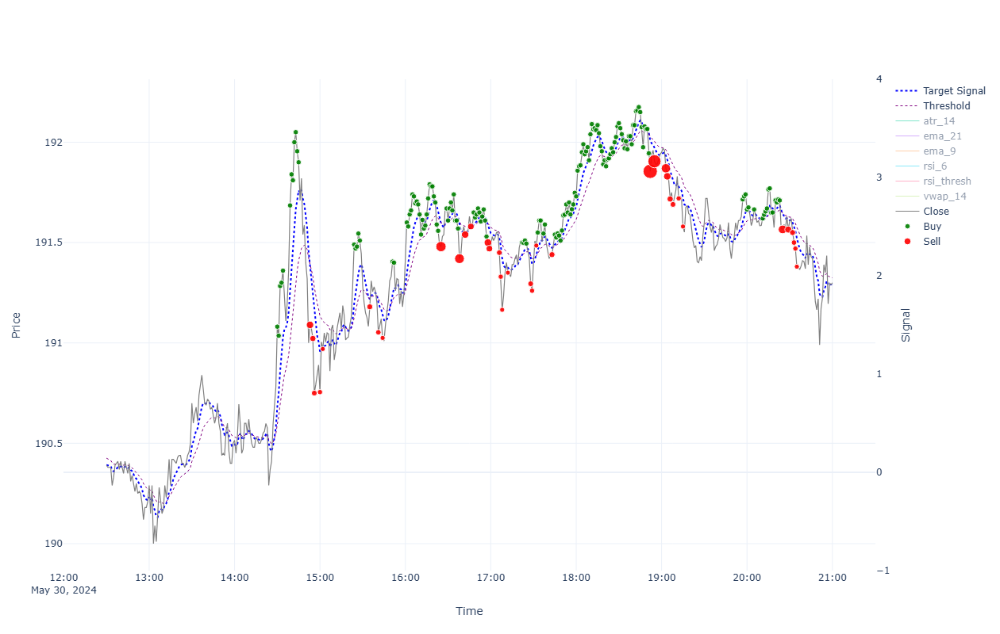


=== Performance for 2024-05-30 ===

INTRADAY:
  shares(495); [ask_buy=191.119, fee_buy=0.004, pos_amnt_buy=94606.042]; [bid_sell=191.262, fee_sell=0.018, pos_amnt_sell=94665.459]; PNL=59.417
TRADES:
  Tr[1]: Time(14:30)Ask(191.119)Bid(191.043)Act(Buy)Shrs(2)Pos(2); CashTr(-382.247)=Cost(-382.239)-Fee(-0.008); P&L(99387.731)=CashTot(99005.646)+PosAmt(382.086)
  Tr[2]: Time(14:31)Ask(191.074)Bid(190.998)Act(Buy)Shrs(2)Pos(4); CashTr(-382.156)=Cost(-382.148)-Fee(-0.008); P&L(99387.48)=CashTot(98623.489)+PosAmt(763.991)
  Tr[3]: Time(14:32)Ask(191.322)Bid(191.245)Act(Buy)Shrs(2)Pos(6); CashTr(-382.652)=Cost(-382.644)-Fee(-0.008); P&L(99388.309)=CashTot(98240.838)+PosAmt(1147.471)
  Tr[4]: Time(14:33)Ask(191.338)Bid(191.262)Act(Buy)Shrs(2)Pos(8); CashTr(-382.685)=Cost(-382.677)-Fee(-0.008); P&L(99388.247)=CashTot(97858.153)+PosAmt(1530.094)
  Tr[5]: Time(14:34)Ask(191.398)Bid(191.322)Act(Buy)Shrs(2)Pos(10); CashTr(-382.805)=Cost(-382.797)-Fee(-0.008); P&L(99388.566)=CashTot(97475.349)+PosA

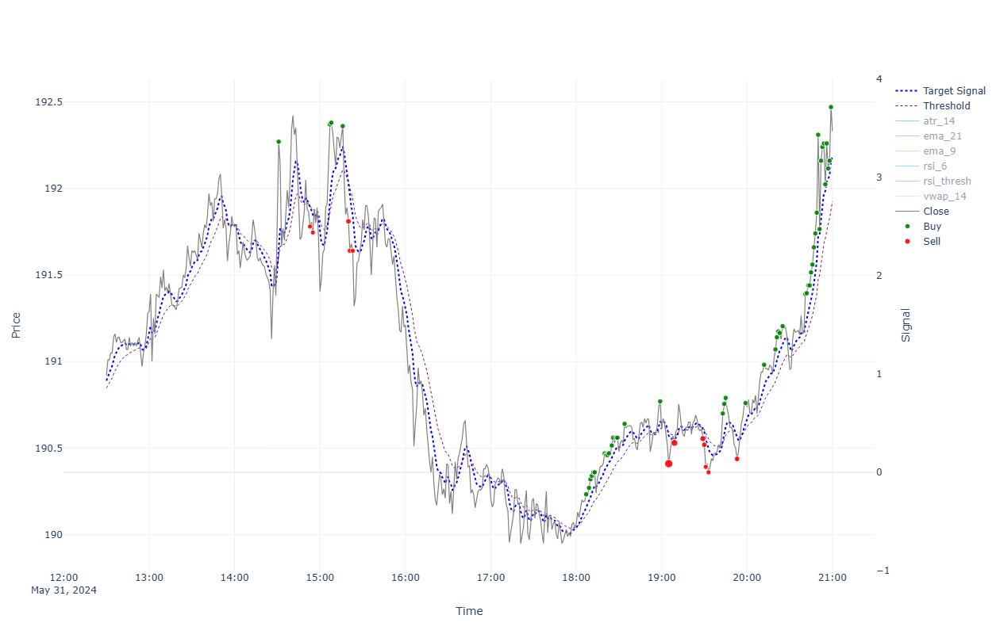


=== Performance for 2024-05-31 ===

INTRADAY:
  shares(493); [ask_buy=191.933, fee_buy=0.004, pos_amnt_buy=94625.128]; [bid_sell=192.292, fee_sell=0.018, pos_amnt_sell=94790.649]; PNL=165.521
TRADES:
  Tr[1]: Time(14:31)Ask(192.308)Bid(192.232)Act(Buy)Shrs(2)Pos(2); CashTr(-384.625)=Cost(-384.617)-Fee(-0.008); P&L(99309.793)=CashTot(98925.33)+PosAmt(384.463)
  Tr[2]: Time(14:53)Ask(191.818)Bid(191.742)Act(Sell)Shrs(1)Pos(1); CashTr(191.723)=Cost(191.742)-Fee(-0.018); P&L(99308.794)=CashTot(99117.053)+PosAmt(191.742)
  Tr[3]: Time(14:55)Ask(191.784)Bid(191.707)Act(Sell)Shrs(1)Pos(0); CashTr(191.689)=Cost(191.707)-Fee(-0.018); P&L(99308.741)=CashTot(99308.741)+PosAmt(0.0)
  Tr[4]: Time(15:07)Ask(192.408)Bid(192.332)Act(Buy)Shrs(2)Pos(2); CashTr(-384.825)=Cost(-384.817)-Fee(-0.008); P&L(99308.58)=CashTot(98923.917)+PosAmt(384.663)
  Tr[5]: Time(15:08)Ask(192.418)Bid(192.342)Act(Buy)Shrs(2)Pos(4); CashTr(-384.845)=Cost(-384.837)-Fee(-0.008); P&L(99308.438)=CashTot(98539.072)+PosAmt(769.36

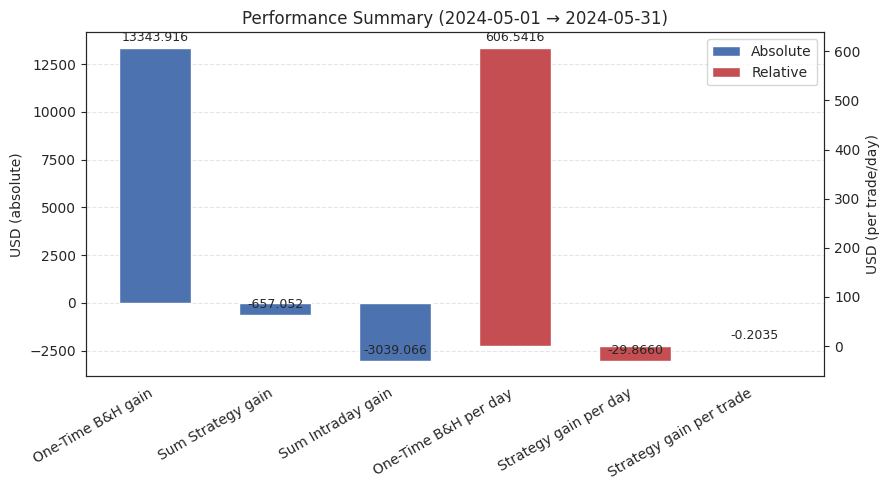


Overall Summary (2024-05-01 = 169.614 → 2024-05-31 = 192.292)
Num. trading days: 22
Trades Count: 3229
Initial capital: 100000.000

One-Time B&H gain: 13343.916 | final: 113343.916 | PnL%: 13.34%
Sum Strategy gain: -657.052 | final: 99342.948 | PnL%: -0.66%
Sum Intraday gain: -3039.066 | final: 96960.934 | PnL%: -3.04%

One-Time B&H gain per day: 606.5416
Strategy gain per day: -29.8660
Strategy gain per trade: -0.2035


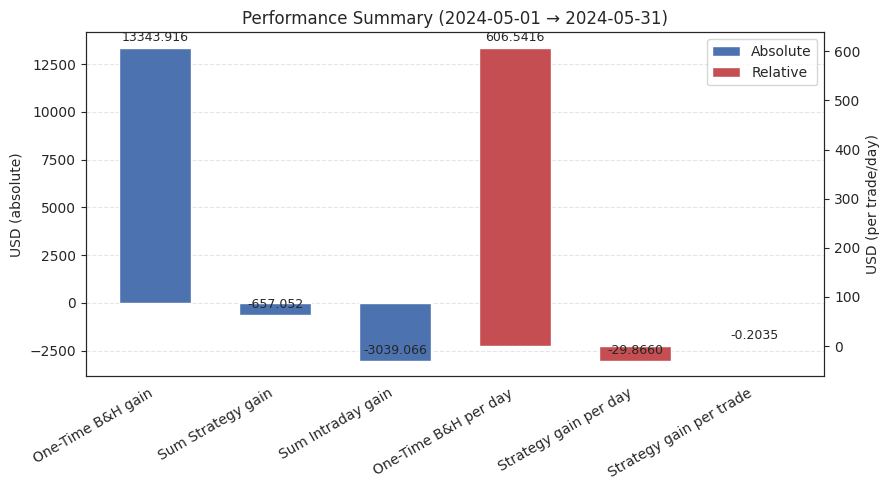

In [5]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]
days_all = [d for d in sim_results]

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day_plot, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df                 = df_day_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            trades             = trades_day,
            performance_stats  = stats_day,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            start_plot         = params.sess_start_shift,
            autoscale          = False
        )
        
        print(f"\n=== Performance for {day.strftime('%Y-%m-%d')} ===\n")
        
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance(df = df_month, 
                            perf_list = [sim_results[d][2] for d in sorted(days_in_month)])
plots.aggregate_performance(df = df_inds_test,
                            perf_list = [sim_results[d][2] for d in sorted(days_all)])
